# SAR Data Exploration for Normalization

This notebook explores SAR data from 20 products to determine optimal min/max values for normalization.
We'll analyze pixel intensity histograms for both RC and AZ levels to find appropriate normalization bounds.

In [1]:
import sys 
import os 
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
import torch
import logging
import time
from typing import Dict, Any, List, Tuple
import matplotlib.pyplot as plt
from dataloader import SARDataloader, get_sar_dataloader, SampleFilter
import numpy as np
from tqdm import tqdm
from utils import get_sample_visualization, display_inference_results

def setup_logging():
    logging.basicConfig(
        level=logging.INFO,
        format='%(asctime)s - %(levelname)s - %(message)s',
        handlers=[
            logging.FileHandler("data_exploration.log"),
            logging.StreamHandler()
        ]
    )
    return logging.getLogger()

logger = setup_logging()
logger.info("Starting SAR data exploration for normalization analysis")

2025-10-15 08:12:50,423 - INFO - Starting SAR data exploration for normalization analysis


## Configuration Setup

Load configuration and create dataloaders for exploration. We'll modify the configuration to load more products.

In [2]:
# Load configuration
dataloader_cfg = {
    "data_dir": "/Data/sar_focusing",
    "level_from": "rc",
    "level_to": "az",
    "num_workers": 0,
    "patch_mode": "rectangular",
    "patch_size": [10000, 10000],
    "buffer": [1000, 1000],
    "stride": [5000, 5000],
    "max_base_sample_size": [50000, 50000],
    "shuffle_files": False,
    "complex_valued": True,
    "save_samples": False,
    "backend": "zarr",
    "verbose": False,
    "cache_size": 5,
    "online": True,
    "concatenate_patches": False,
    "concat_axis": 0,
    "positional_encoding": False,
    "batch_size": 1,
    "samples_per_prod": 1,
    "patch_order": "row",
    "max_products": 10,
}
filters = {
    "years": [2023],
    "polarizations": ["vv"]
}


logger.info(f"Configuration loaded from: {dataloader_cfg}")
logger.info(f"Data directory: {dataloader_cfg.get('data_dir', 'Not specified')}")
logger.info(f"Level from: {dataloader_cfg.get('level_from', 'rc')}")
logger.info(f"Level to: {dataloader_cfg.get('level_to', 'az')}")
logger.info(f"Patch size: {dataloader_cfg.get('patch_size', [1000, 1])}")
logger.info(f"Products per split: {dataloader_cfg.get('max_products', 1)}")

2025-10-15 08:12:50,436 - INFO - Configuration loaded from: {'data_dir': '/Data/sar_focusing', 'level_from': 'rc', 'level_to': 'az', 'num_workers': 0, 'patch_mode': 'rectangular', 'patch_size': [10000, 10000], 'buffer': [1000, 1000], 'stride': [5000, 5000], 'max_base_sample_size': [50000, 50000], 'shuffle_files': False, 'complex_valued': True, 'save_samples': False, 'backend': 'zarr', 'verbose': False, 'cache_size': 5, 'online': True, 'concatenate_patches': False, 'concat_axis': 0, 'positional_encoding': False, 'batch_size': 1, 'samples_per_prod': 1, 'patch_order': 'row', 'max_products': 10}
2025-10-15 08:12:50,437 - INFO - Data directory: /Data/sar_focusing
2025-10-15 08:12:50,438 - INFO - Level from: rc
2025-10-15 08:12:50,439 - INFO - Level to: az
2025-10-15 08:12:50,440 - INFO - Patch size: [10000, 10000]
2025-10-15 08:12:50,441 - INFO - Products per split: 10


## Create Dataloaders for Both RC and AZ Levels

We'll create separate dataloaders for RC (input) and AZ (output) levels to analyze their distributions independently.

In [3]:
# Create dataloaders
dataloader_cfg['filters'] = SampleFilter(**filters) if filters else None
exploration_loader = get_sar_dataloader(**dataloader_cfg)
logger.info("Creating dataloaders for exploration...")

# Use train loader for exploration (has the most data)
dataset = exploration_loader.dataset

logger.info(f"Using train loader for exploration with {len(exploration_loader.dataset)} samples")
logger.info(f"Available files: {len(dataset.get_files())}")

Total files found in remote repository: 967


2025-10-15 08:13:09,657 - INFO - Creating dataloaders for exploration...
2025-10-15 08:13:09,658 - INFO - Using train loader for exploration with 10 samples
2025-10-15 08:13:09,659 - INFO - Available files: 10


## Histogram Plotting Functions

Using the same histogram plotting style as in the inference visualization notebook.

In [4]:
def plot_data_exploration_histograms(data_stats: Dict[str, np.ndarray], figsize=(20, 16), bins=200):
    """
    Plot histograms for RC and AZ data exploration.
    Similar style to the inference visualization but for normalization analysis.
    """
    # Create subplots: 2 rows (RC vs AZ) x 2 cols (real vs imaginary)
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    # Data arrays
    rc_real = data_stats['rc_real']
    rc_imag = data_stats['rc_imag']
    az_real = data_stats['az_real']
    az_imag = data_stats['az_imag']
    
    # Calculate ranges for each dataset
    rc_real_range = (np.min(rc_real), np.max(rc_real)) if len(rc_real) > 0 else (0, 1)
    rc_imag_range = (np.min(rc_imag), np.max(rc_imag)) if len(rc_imag) > 0 else (0, 1)
    az_real_range = (np.min(az_real), np.max(az_real)) if len(az_real) > 0 else (0, 1)
    az_imag_range = (np.min(az_imag), np.max(az_imag)) if len(az_imag) > 0 else (0, 1)
    
    # Plot 1: RC data - Real component
    if len(rc_real) > 0:
        axes[0, 0].hist(rc_real, bins=bins, alpha=0.7, label='RC Real', 
                        color='blue', density=True, range=rc_real_range)
        axes[0, 0].set_title('RC Level - Real Component')
        axes[0, 0].set_xlabel('Pixel Intensity')
        axes[0, 0].set_ylabel('Density')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        axes[0, 0].set_xlim(rc_real_range)
    
    # Plot 2: RC data - Imaginary component
    if len(rc_imag) > 0:
        axes[0, 1].hist(rc_imag, bins=bins, alpha=0.7, label='RC Imag', 
                        color='blue', density=True, range=rc_imag_range)
        axes[0, 1].set_title('RC Level - Imaginary Component')
        axes[0, 1].set_xlabel('Pixel Intensity')
        axes[0, 1].set_ylabel('Density')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        axes[0, 1].set_xlim(rc_imag_range)
    
    # Plot 3: AZ data - Real component
    if len(az_real) > 0:
        axes[1, 0].hist(az_real, bins=bins, alpha=0.7, label='AZ Real', 
                        color='green', density=True, range=az_real_range)
        axes[1, 0].set_title('AZ Level - Real Component')
        axes[1, 0].set_xlabel('Pixel Intensity')
        axes[1, 0].set_ylabel('Density')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        axes[1, 0].set_xlim(az_real_range)
    
    # Plot 4: AZ data - Imaginary component
    if len(az_imag) > 0:
        axes[1, 1].hist(az_imag, bins=bins, alpha=0.7, label='AZ Imag', 
                        color='green', density=True, range=az_imag_range)
        axes[1, 1].set_title('AZ Level - Imaginary Component')
        axes[1, 1].set_xlabel('Pixel Intensity')
        axes[1, 1].set_ylabel('Density')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)
        axes[1, 1].set_xlim(az_imag_range)
    
    # Add statistics text to each subplot
    data_arrays = [(rc_real, 'RC Real'), (rc_imag, 'RC Imag'), (az_real, 'AZ Real'), (az_imag, 'AZ Imag')]
    
    for idx, (data, label) in enumerate(data_arrays):
        row, col = divmod(idx, 2)
        if len(data) > 0:
            mean_val = np.mean(data)
            std_val = np.std(data)
            min_val = np.min(data)
            max_val = np.max(data)
            
            # Calculate percentiles for normalization recommendations
            p1 = np.percentile(data, 1)
            p99 = np.percentile(data, 99)
            p5 = np.percentile(data, 5)
            p95 = np.percentile(data, 95)
            
            stats_text = f'{label}\n'
            stats_text += f'μ={mean_val:.2f}, σ={std_val:.2f}\n'
            stats_text += f'Min={min_val:.2f}, Max={max_val:.2f}\n'
            stats_text += f'P1={p1:.2f}, P99={p99:.2f}\n'
            stats_text += f'P5={p5:.2f}, P95={p95:.2f}'
            
            axes[row, col].text(0.02, 0.98, stats_text, transform=axes[row, col].transAxes, 
                               verticalalignment='top', 
                               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                               fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    return fig

## Data Collection Functions

Functions to collect data from multiple products and create histograms similar to the inference visualization.

In [5]:
def collect_data_statistics(dataloader: SARDataloader, max_samples: int = 2000, max_products: int = 20) -> Dict[str, np.ndarray]:
    """
    Collect pixel intensity statistics from multiple products.
    
    Args:
        dataloader: SAR dataloader
        max_samples: Maximum number of samples to collect
        max_products: Maximum number of products to use
        
    Returns:
        Dictionary with collected data for RC and AZ levels
    """
    logger.info(f"Collecting data from up to {max_products} products, {max_samples} samples max")
    
    # Storage for collected data
    rc_data_real = []
    rc_data_imag = []
    az_data_real = []
    az_data_imag = []
    
    samples_collected = 0
    products_used = set()
    
    with torch.no_grad():
        for batch_idx, (input_batch, output_batch) in enumerate(tqdm(dataloader, desc="Collecting data")):
            if samples_collected >= max_samples:
                break
                
            # Convert to numpy
            if isinstance(input_batch, torch.Tensor):
                input_batch = input_batch.cpu().numpy()
            if isinstance(output_batch, torch.Tensor):
                output_batch = output_batch.cpu().numpy()
            
            batch_size = input_batch.shape[0]
            
            for sample_idx in range(batch_size):
                if samples_collected >= max_samples:
                    break
                    
                # Get RC data (input)
                rc_sample = input_batch[sample_idx]
                
                # Get AZ data (output)  
                az_sample = output_batch[sample_idx]
                
                # Process RC data
                if rc_sample.ndim > 2:
                    rc_sample = rc_sample.squeeze()
                
                # Convert to complex if needed and extract components
                if np.iscomplexobj(rc_sample):
                    rc_data_real.append(rc_sample.real.flatten())
                    rc_data_imag.append(rc_sample.imag.flatten())
                elif rc_sample.shape[-1] == 2:  # Real/imag in separate channels
                    rc_data_real.append(rc_sample[..., 0].flatten())
                    rc_data_imag.append(rc_sample[..., 1].flatten())
                else:
                    # Assume it's magnitude data
                    rc_data_real.append(rc_sample.flatten())
                
                # Process AZ data
                if az_sample.ndim > 2:
                    az_sample = az_sample.squeeze()
                    
                if np.iscomplexobj(az_sample):
                    az_data_real.append(az_sample.real.flatten())
                    az_data_imag.append(az_sample.imag.flatten())
                elif az_sample.shape[-1] == 2:  # Real/imag in separate channels
                    az_data_real.append(az_sample[..., 0].flatten())
                    az_data_imag.append(az_sample[..., 1].flatten())
                else:
                    # Assume it's magnitude data
                    az_data_real.append(az_sample.flatten())
                
                samples_collected += 1
                
                # Track products
                product_idx = batch_idx * batch_size + sample_idx 
                products_used.add(product_idx)
                
                # Plot amplitude image
                print(f"Displaying sample from product {dataset.get_files()[product_idx]}" )
                rc_ampl, _, _ = get_sample_visualization(data=rc_sample, vminmax='auto')
                az_ampl, _, _ = get_sample_visualization(data=az_sample, vminmax='auto')
                display_inference_results(rc_ampl, az_ampl, pred_data=None, figsize=(15, 5), vminmax='auto', show=True, save=False)
                # Plot histogram
                plot_data_exploration_histograms(data_stats={        
                    'rc_real': rc_data_real[-1] if rc_data_real else np.array([]),
                    'rc_imag': rc_data_imag[-1] if rc_data_imag else np.array([]),
                    'az_real': az_data_real[-1] if az_data_real else np.array([]),
                    'az_imag': az_data_imag[-1] if az_data_imag else np.array([]),
                })
                if len(products_used) >= max_products:
                    logger.info(f"Reached max products limit: {max_products}")
                    break
            
            if len(products_used) >= max_products:
                break
    
    # Concatenate all collected data
    result = {
        'rc_real': rc_data_real if rc_data_real else [],
        'rc_imag': rc_data_imag if rc_data_imag else [],
        'az_real': az_data_real if az_data_real else [],
        'az_imag': az_data_imag if az_data_imag else [],
        'samples_collected': samples_collected,
        'products_used': len(products_used)
    }
    
    logger.info(f"Collected {samples_collected} samples from {len(products_used)} products")
    for key, data in result.items():
        if isinstance(data, np.ndarray) and data.size > 0:
            logger.info(f"{key}: {len(data)} values, range [{np.min(data):.2f}, {np.max(data):.2f}]")
    
    return result

## Plot Histograms and Analysis

2025-10-15 08:13:09,736 - INFO - Starting data collection...
2025-10-15 08:13:09,737 - INFO - Collecting data from up to 10 products, 5000 samples max

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230331t123129-20230331t123154-047888-05c119.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230331t123129-20230331t123154-047888-05c119.zarr


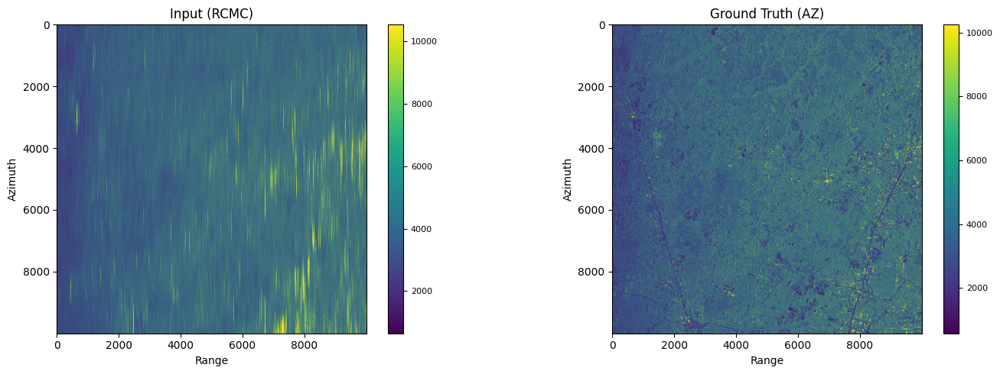

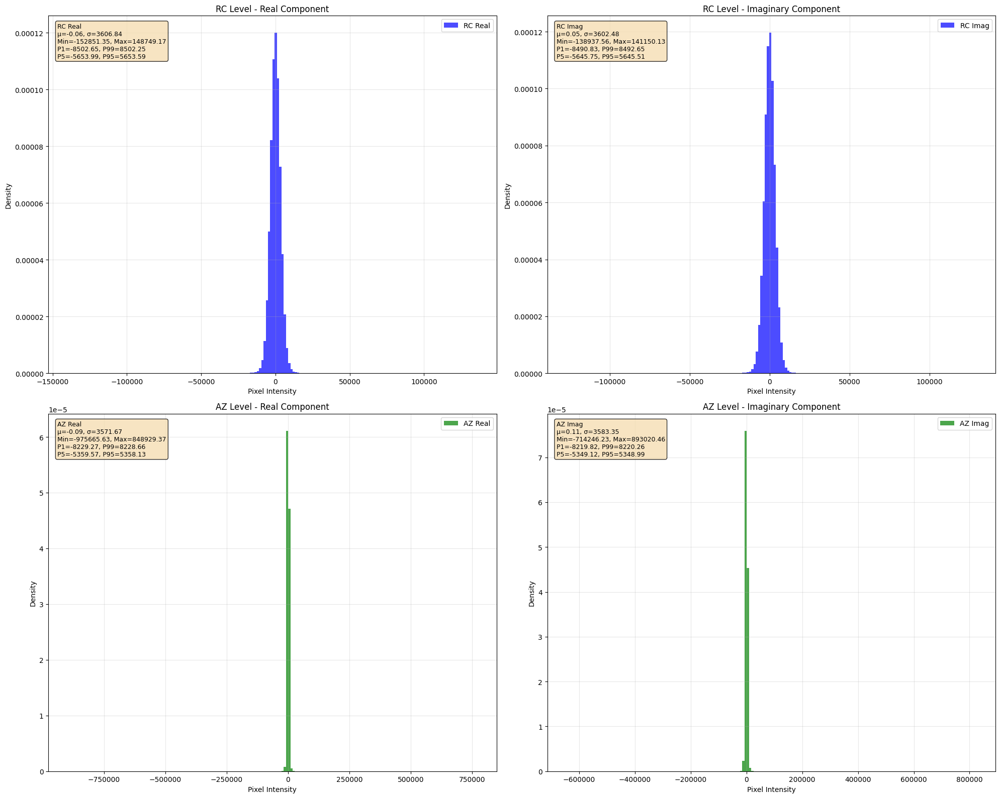

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230423t020723-20230423t020749-048217-05cc37.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230423t020723-20230423t020749-048217-05cc37.zarr


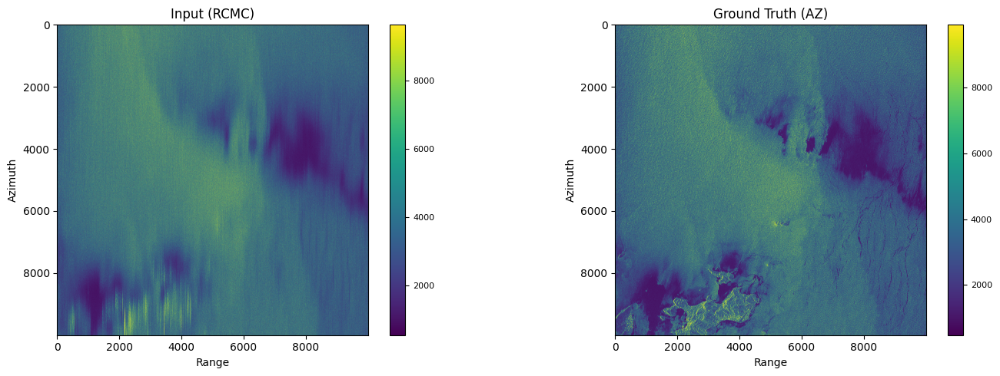

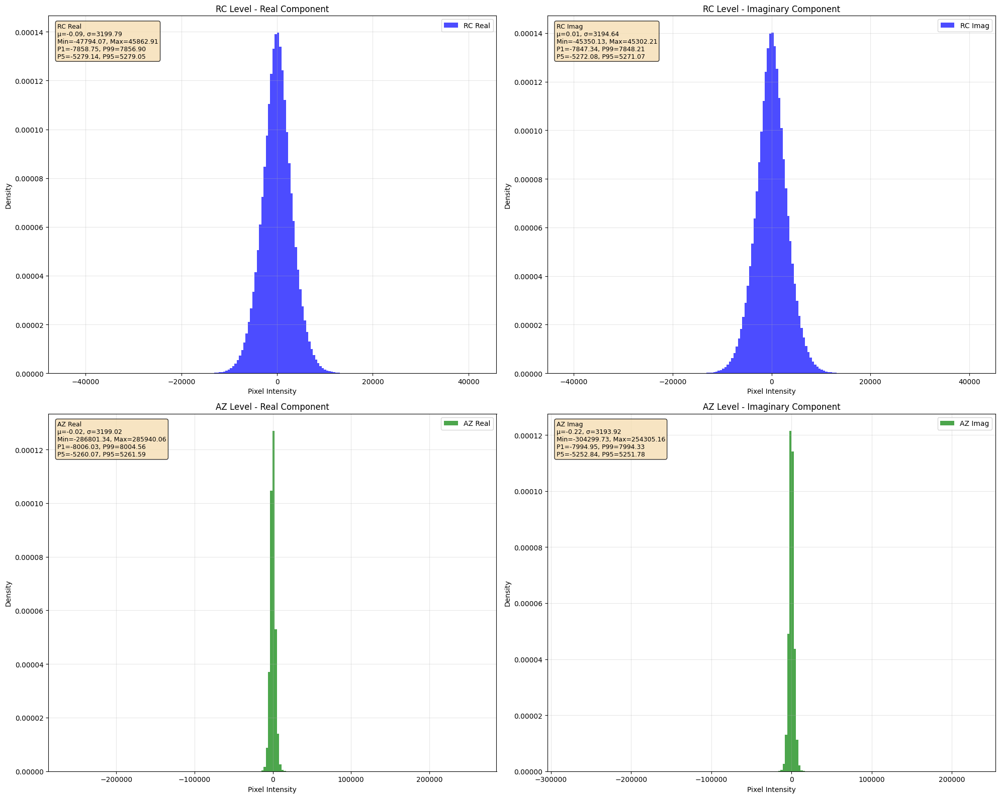

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230505t020724-20230505t020749-048392-05d21b.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230505t020724-20230505t020749-048392-05d21b.zarr


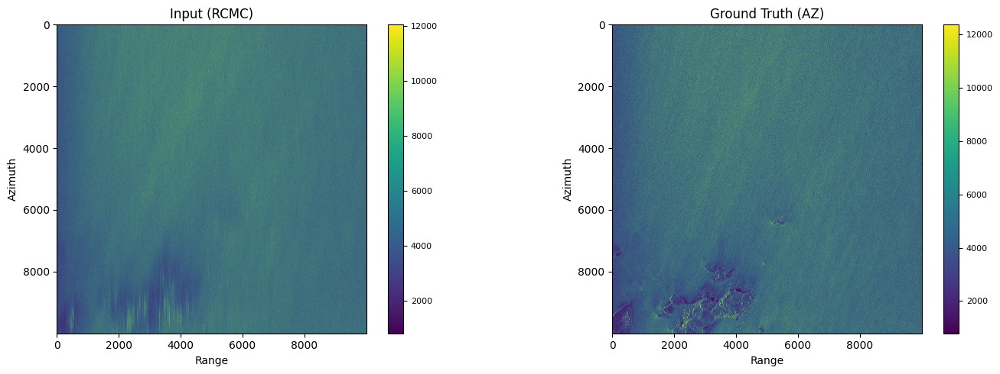

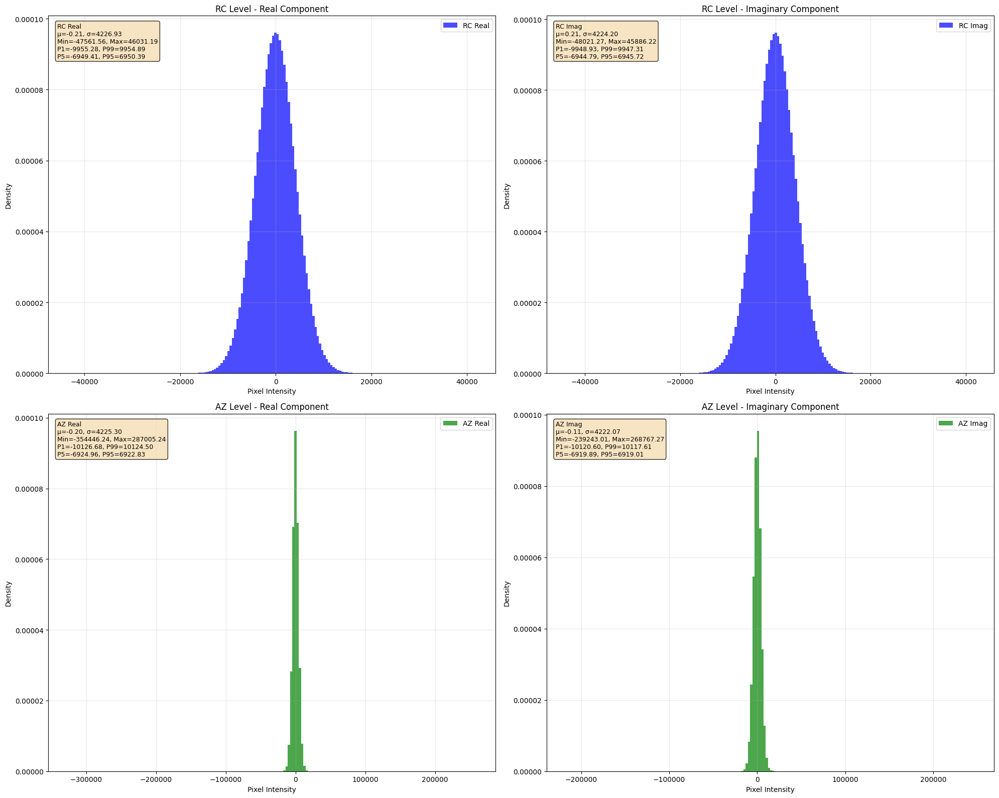

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230530t123131-20230530t123157-048763-05dd44.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230530t123131-20230530t123157-048763-05dd44.zarr


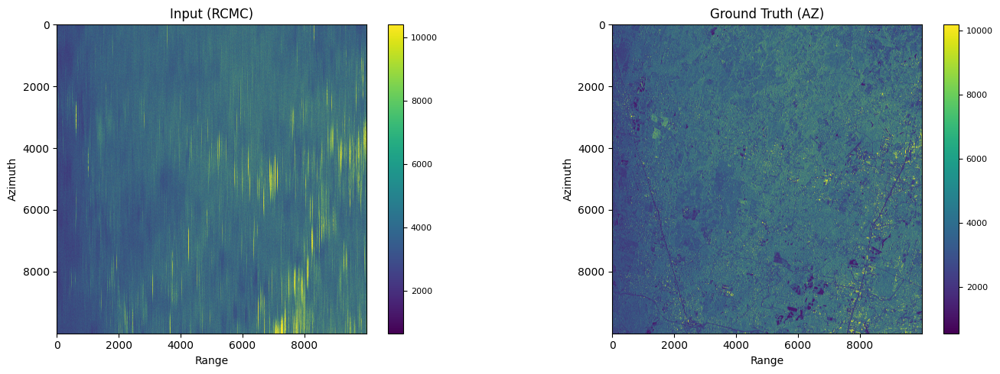

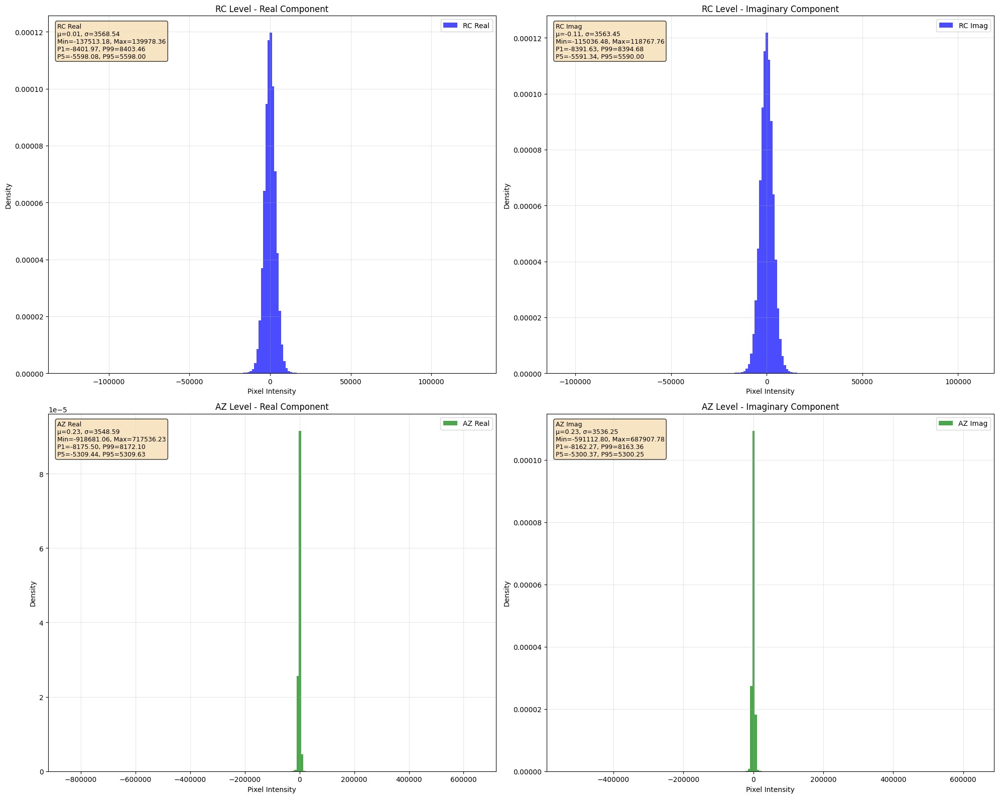

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230704t020727-20230704t020753-049267-05ec9b.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230704t020727-20230704t020753-049267-05ec9b.zarr


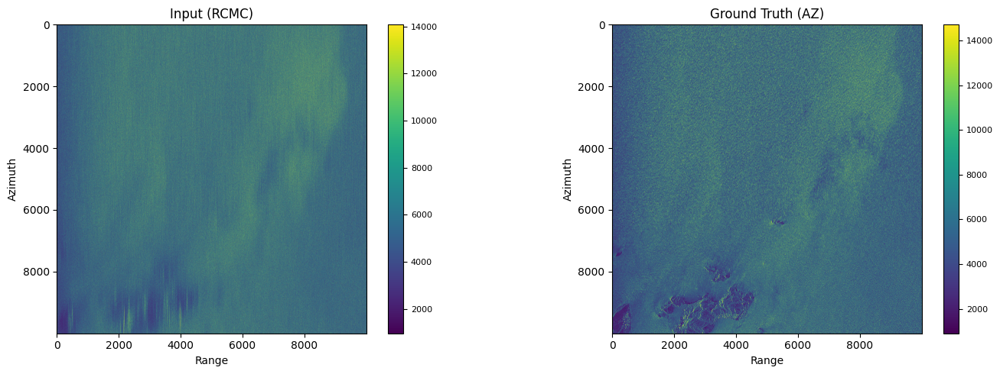

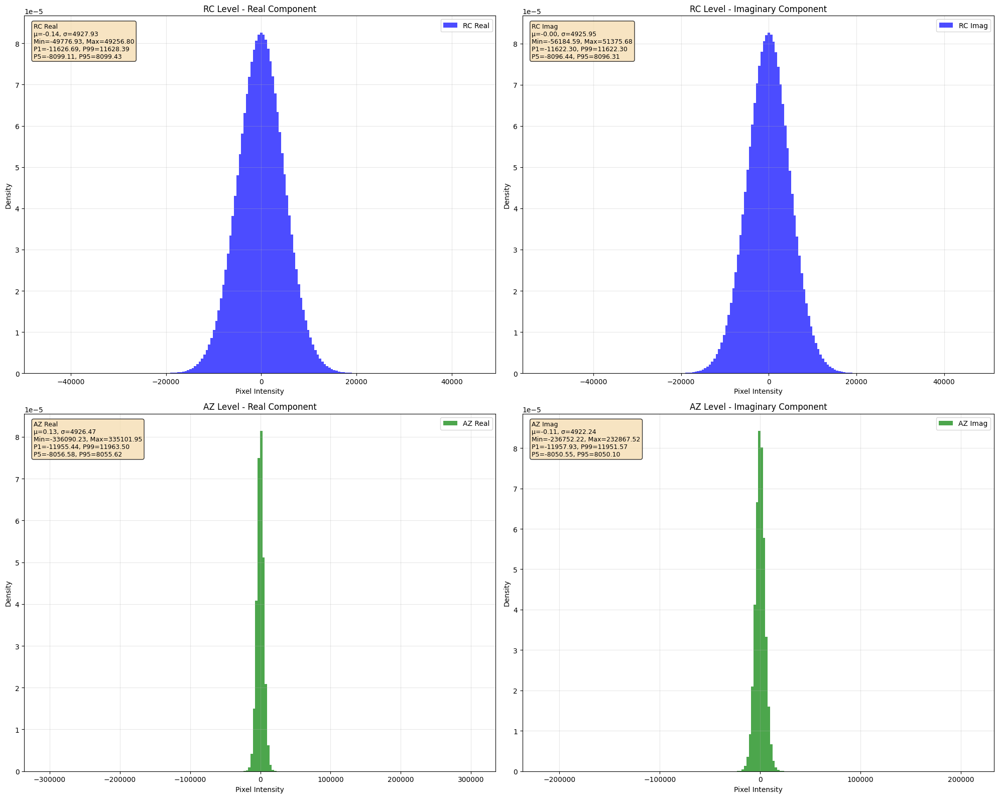

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230716t020728-20230716t020754-049442-05f206.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230716t020728-20230716t020754-049442-05f206.zarr


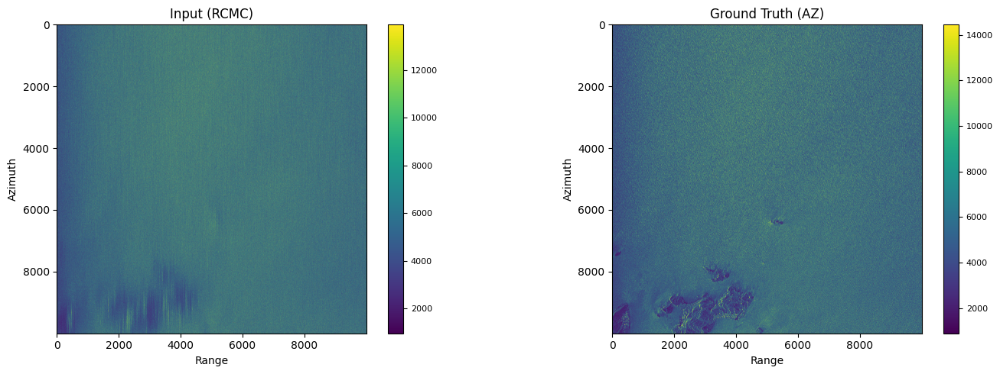

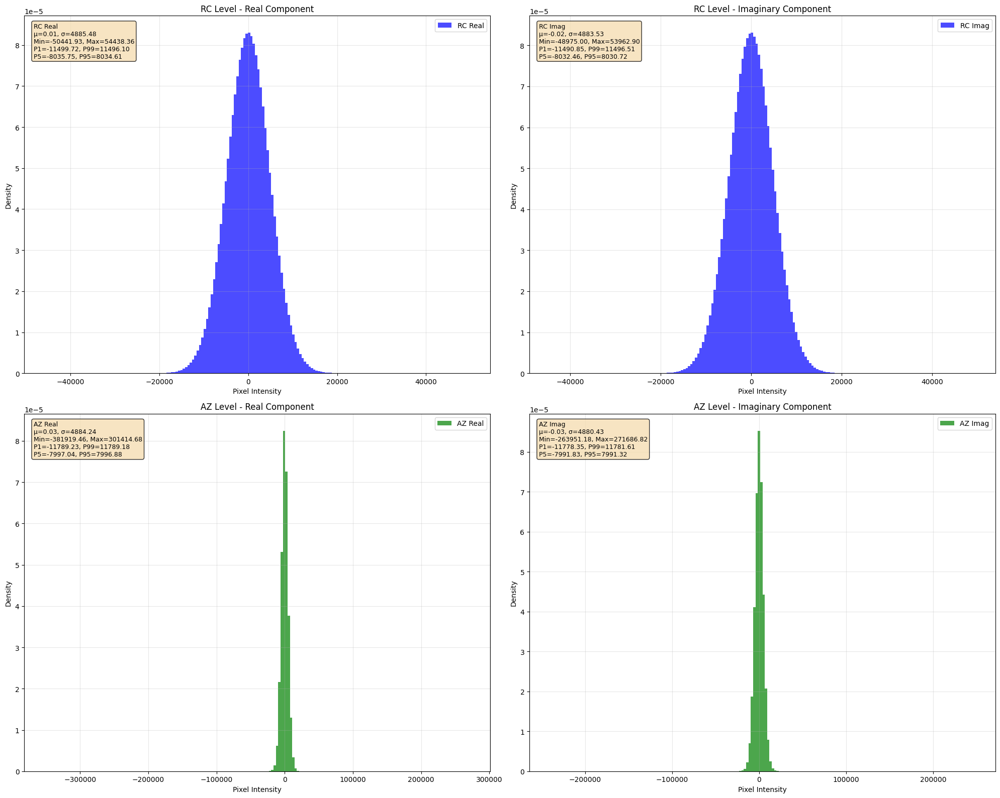

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230915t123137-20230915t123203-050338-060f7d.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20230915t123137-20230915t123203-050338-060f7d.zarr


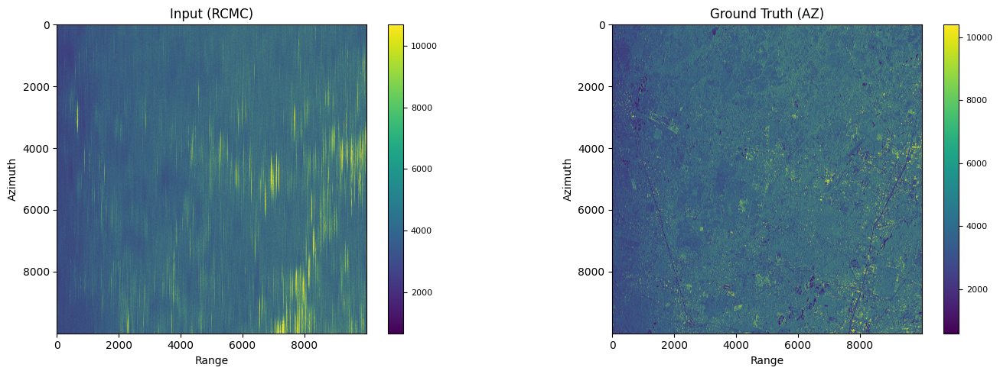

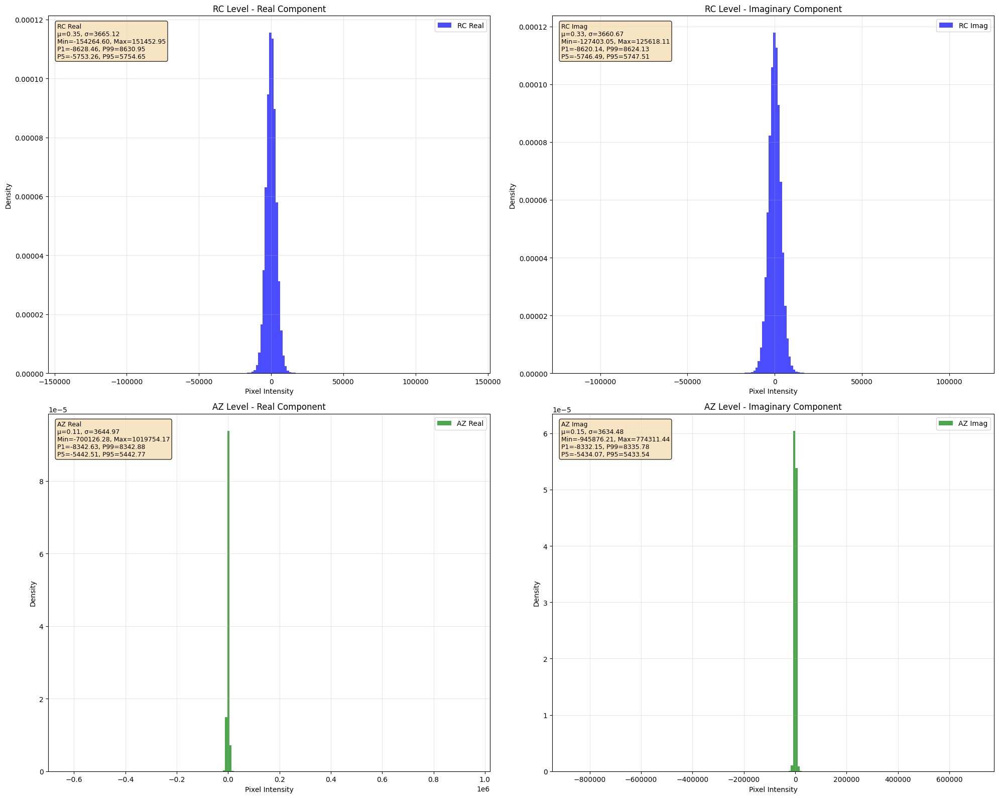

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20231126t123136-20231126t123202-051388-063383.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20231126t123136-20231126t123202-051388-063383.zarr


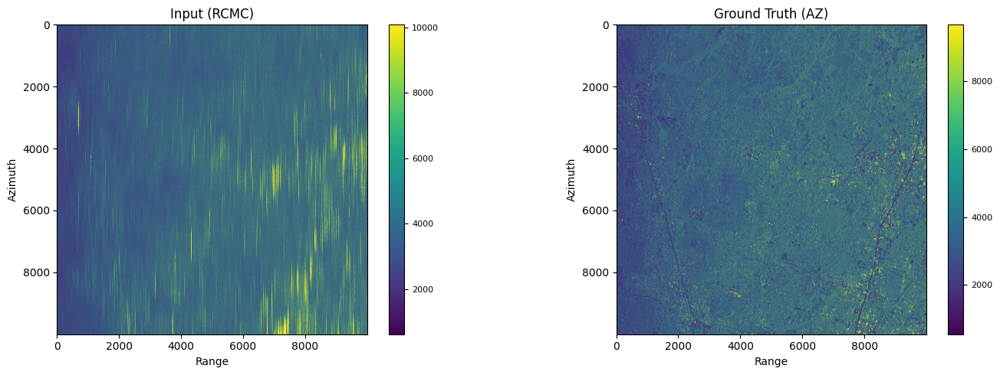

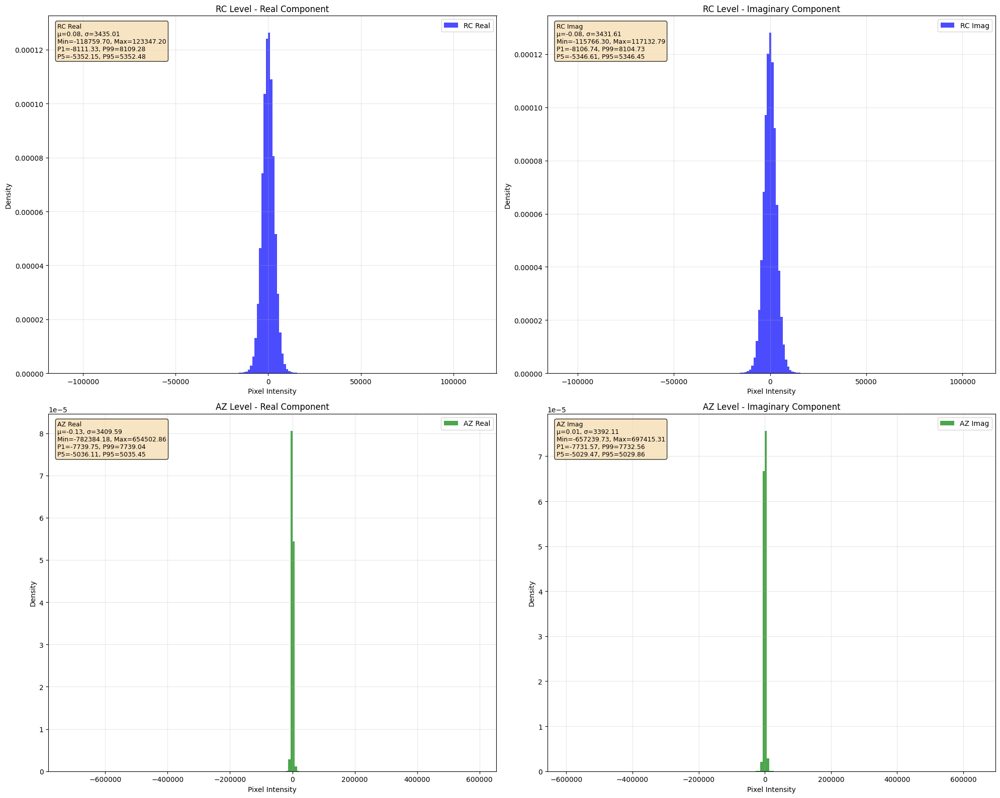

Calculating patches for file /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20231231t020729-20231231t020755-051892-0644fe.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s1-raw-s-vv-20231231t020729-20231231t020755-051892-0644fe.zarr


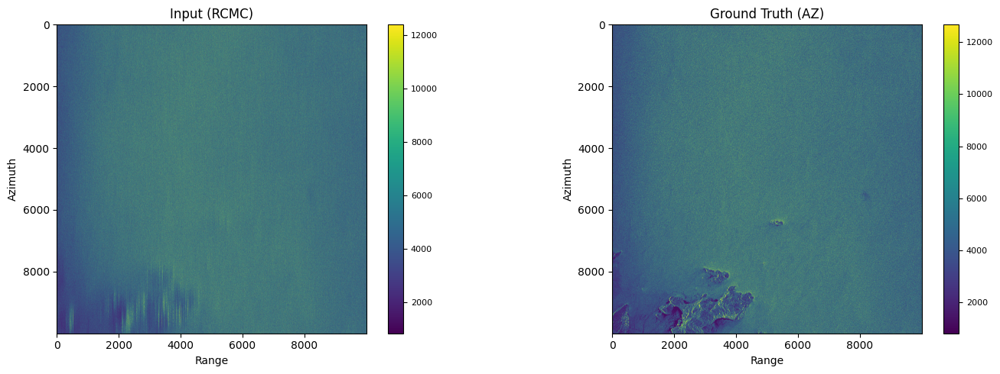

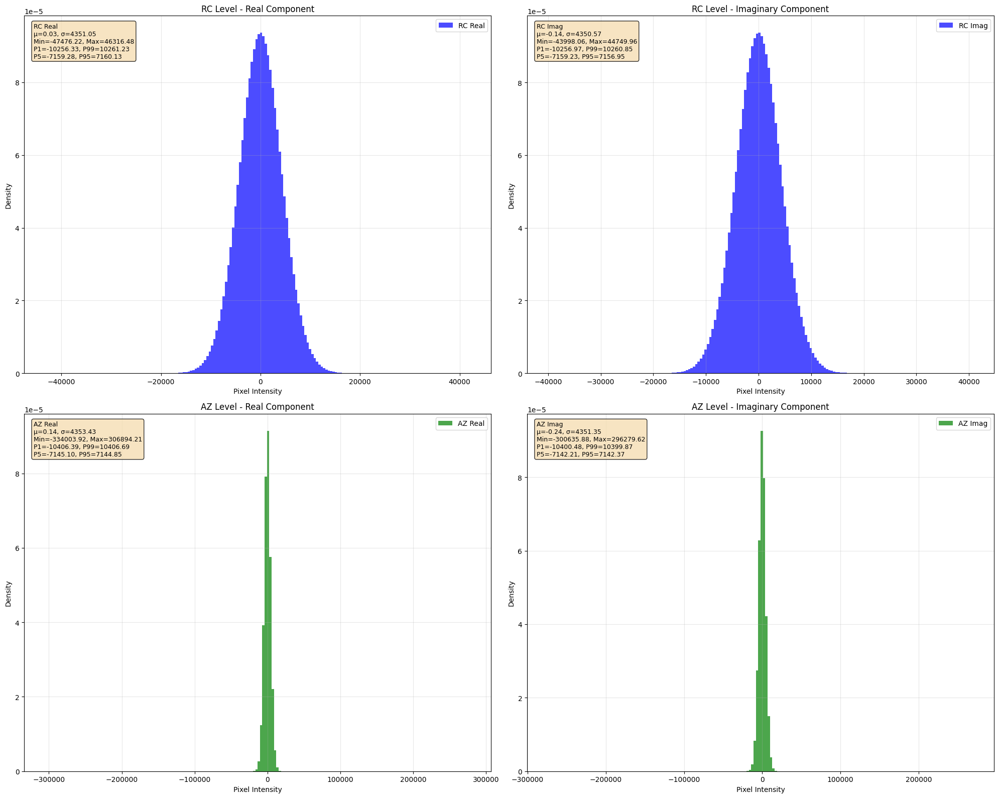

Calculating patches for file /Data/sar_focusing/PT1/s1a-s2-raw-s-vv-20230520t014915-20230520t014936-048611-05d8b7.zarr
Displaying sample from product /Data/sar_focusing/PT1/s1a-s2-raw-s-vv-20230520t014915-20230520t014936-048611-05d8b7.zarr


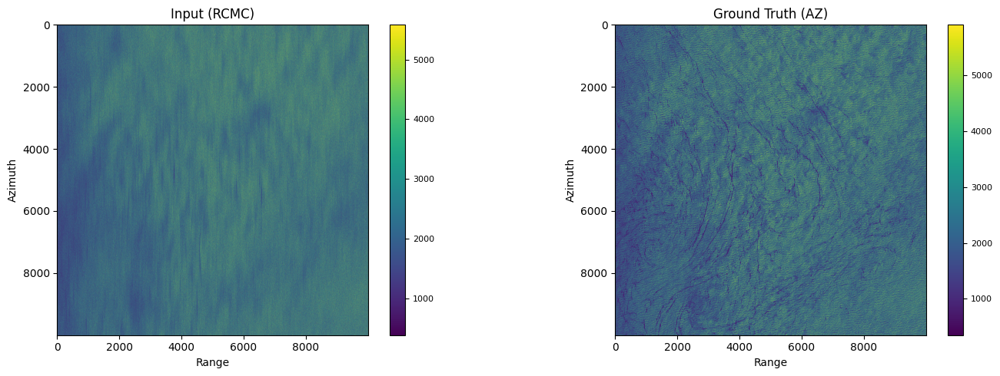

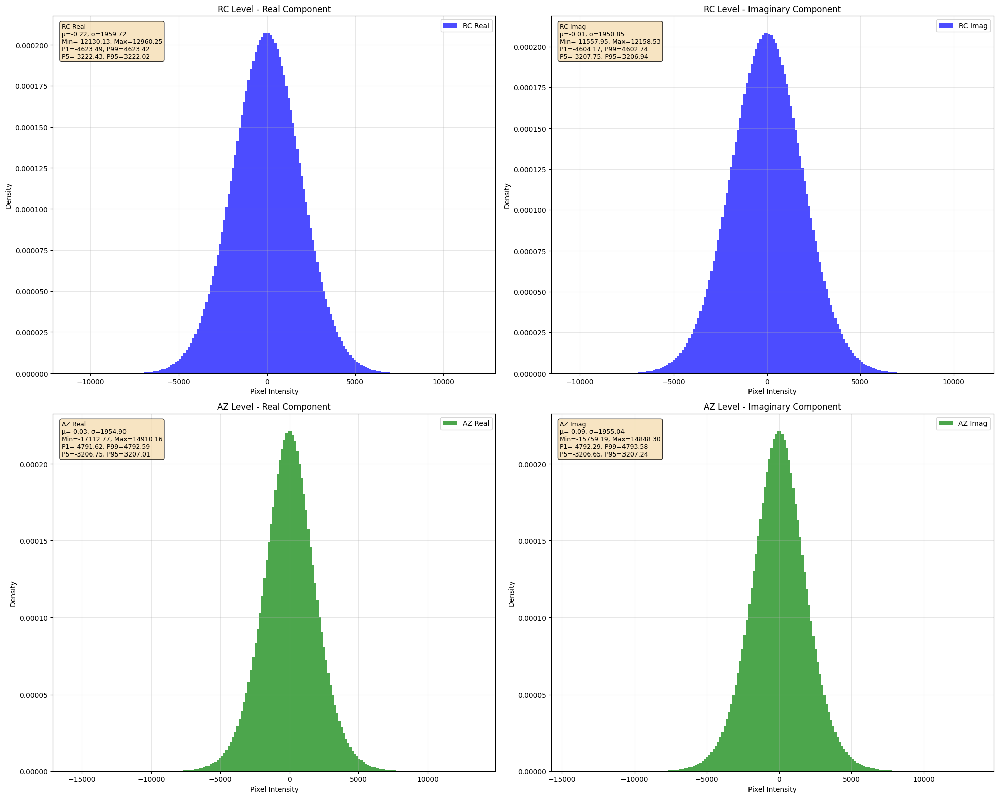

2025-10-15 08:31:08,614 - INFO - Reached max products limit: 10
2025-10-15 08:31:08,616 - INFO - Collected 10 samples from 10 products
2025-10-15 08:31:08,623 - INFO - Data collection completed!



Collected data summary:
Samples collected: 10
Products used: 10
RC real values: 10
RC imag values: 10
AZ real values: 10
AZ imag values: 10


In [6]:
# Collect data statistics
logger.info("Starting data collection...")
data_stats = collect_data_statistics(
    exploration_loader, 
    max_samples=5000,  
    max_products=10     
)

logger.info("Data collection completed!")
print(f"\nCollected data summary:")
print(f"Samples collected: {data_stats['samples_collected']}")
print(f"Products used: {data_stats['products_used']}")
print(f"RC real values: {len(data_stats['rc_real'])}")
print(f"RC imag values: {len(data_stats['rc_imag'])}")
print(f"AZ real values: {len(data_stats['az_real'])}")
print(f"AZ imag values: {len(data_stats['az_imag'])}")

2025-10-15 08:31:08,635 - INFO - Creating histograms for data exploration...


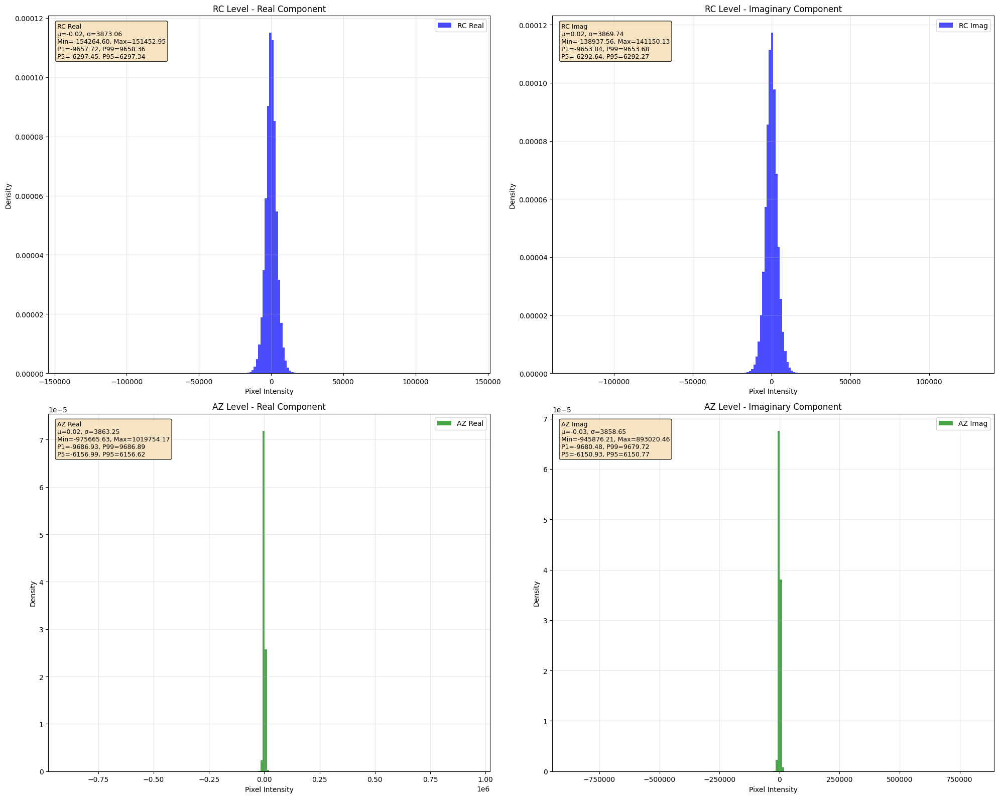

In [7]:
# Plot histograms
del exploration_loader
logger.info("Creating histograms for data exploration...")
aggregated_data_stats = {
    'rc_real': np.concatenate(data_stats['rc_real']) if data_stats['rc_real'] else np.array([]),
    'rc_imag': np.concatenate(data_stats['rc_imag']) if data_stats['rc_imag'] else np.array([]),
    'az_real': np.concatenate(data_stats['az_real']) if data_stats['az_real'] else np.array([]),
    'az_imag': np.concatenate(data_stats['az_imag']) if data_stats['az_imag'] else np.array([]),
    'samples_collected': data_stats['samples_collected'],
    'products_used': data_stats['products_used']
}   
del data_stats
fig = plot_data_exploration_histograms(aggregated_data_stats, figsize=(20, 16), bins=200)


## Statistical Analysis and Normalization Recommendations

In [8]:
def calculate_normalization_bounds(data: np.ndarray, method: str = 'percentile') -> Tuple[float, float]:
    """
    Calculate normalization bounds using different methods.
    
    Args:
        data: Input data array
        method: Method to use ('percentile', 'std', 'minmax', 'robust')
        
    Returns:
        Tuple of (min_bound, max_bound)
    """
    if len(data) == 0:
        return 0.0, 1.0
    
    if method == 'percentile':
        # Use 1st and 99th percentiles to exclude extreme outliers
        return float(np.percentile(data, 1)), float(np.percentile(data, 99))
    elif method == 'percentile_5_95':
        # More conservative: 5th and 95th percentiles
        return float(np.percentile(data, 5)), float(np.percentile(data, 95))
    elif method == 'std':
        # Mean ± 3 standard deviations (captures ~99.7% of data)
        mean = np.mean(data)
        std = np.std(data)
        return float(mean - 3*std), float(mean + 3*std)
    elif method == 'robust':
        # Median ± 3 * MAD (Median Absolute Deviation)
        median = np.median(data)
        mad = np.median(np.abs(data - median))
        return float(median - 3*mad), float(median + 3*mad)
    elif method == 'minmax':
        # Absolute min/max (includes all outliers)
        return float(np.min(data)), float(np.max(data))
    else:
        raise ValueError(f"Unknown method: {method}")

# Calculate normalization bounds for all data
methods = ['percentile', 'percentile_5_95', 'std', 'robust', 'minmax']
data_types = {
    'RC Real': aggregated_data_stats['rc_real'],
    'RC Imag': aggregated_data_stats['rc_imag'],
    'AZ Real': aggregated_data_stats['az_real'],
    'AZ Imag': aggregated_data_stats['az_imag']
}

print("\n" + "="*80)
print("NORMALIZATION BOUNDS ANALYSIS")
print("="*80)

normalization_recommendations = {}

for data_name, data in data_types.items():
    if len(data) == 0:
        continue
        
    print(f"\n{data_name} Data Analysis:")
    print("-" * 40)
    
    # Basic statistics
    print(f"Samples: {len(data):,}")
    print(f"Mean: {np.mean(data):.4f}")
    print(f"Std: {np.std(data):.4f}")
    print(f"Min: {np.min(data):.4f}")
    print(f"Max: {np.max(data):.4f}")
    print(f"Median: {np.median(data):.4f}")
    
    print("\nNormalization Bounds by Method:")
    method_bounds = {}
    
    for method in methods:
        min_bound, max_bound = calculate_normalization_bounds(data, method)
        method_bounds[method] = (min_bound, max_bound)
        
        # Calculate percentage of data that would be clipped
        below_min = np.sum(data < min_bound) / len(data) * 100
        above_max = np.sum(data > max_bound) / len(data) * 100
        total_clipped = below_min + above_max
        
        print(f"  {method:15s}: [{min_bound:8.2f}, {max_bound:8.2f}] "
              f"(clips {total_clipped:5.2f}% of data)")
    
    normalization_recommendations[data_name] = method_bounds

print("\n" + "="*80)
print("RECOMMENDED NORMALIZATION VALUES")
print("="*80)

# Provide specific recommendations
print("\nBased on the analysis, here are the recommended normalization bounds:")
print("\n1. CONSERVATIVE APPROACH (Percentile 5-95):")
print("   - Preserves most detail, clips ~10% of extreme values")
for data_name, bounds in normalization_recommendations.items():
    if 'percentile_5_95' in bounds:
        min_val, max_val = bounds['percentile_5_95']
        print(f"   - {data_name:12s}: MIN = {min_val:8.2f}, MAX = {max_val:8.2f}")

print("\n2. BALANCED APPROACH (Percentile 1-99):")
print("   - Good balance between detail preservation and outlier handling")
for data_name, bounds in normalization_recommendations.items():
    if 'percentile' in bounds:
        min_val, max_val = bounds['percentile']
        print(f"   - {data_name:12s}: MIN = {min_val:8.2f}, MAX = {max_val:8.2f}")

print("\n3. ROBUST APPROACH (Median ± 3*MAD):")
print("   - Robust to outliers, good for noisy data")
for data_name, bounds in normalization_recommendations.items():
    if 'robust' in bounds:
        min_val, max_val = bounds['robust']
        print(f"   - {data_name:12s}: MIN = {min_val:8.2f}, MAX = {max_val:8.2f}")


NORMALIZATION BOUNDS ANALYSIS

RC Real Data Analysis:
----------------------------------------
Samples: 1,000,000,000
Mean: -0.0227
Std: 3873.0634
Min: -154264.5990
Max: 151452.9465
Median: 0.0645

Normalization Bounds by Method:
  percentile     : [-9657.72,  9658.36] (clips  2.00% of data)
  percentile_5_95: [-6297.45,  6297.34] (clips 10.00% of data)
  std            : [-11619.21, 11619.17] (clips  0.75% of data)
  robust         : [-6974.29,  6974.42] (clips  7.33% of data)
  minmax         : [-154264.60, 151452.95] (clips  0.00% of data)

RC Imag Data Analysis:
----------------------------------------
Samples: 1,000,000,000
Mean: 0.0234
Std: 3869.7442
Min: -138937.5626
Max: 141150.1259
Median: 0.0945

Normalization Bounds by Method:
  percentile     : [-9653.84,  9653.68] (clips  2.00% of data)
  percentile_5_95: [-6292.64,  6292.27] (clips 10.00% of data)
  std            : [-11609.21, 11609.26] (clips  0.75% of data)
  robust         : [-6963.52,  6963.71] (clips  7.35% of data

## Summary and Conclusions

This analysis provides data-driven normalization bounds for SAR data processing:

1. **Conservative Approach (5-95 percentiles)**: Preserves the most detail but may retain some outliers
2. **Balanced Approach (1-99 percentiles)**: Good balance between detail preservation and outlier removal
3. **Robust Approach**: Uses median and MAD, very robust to extreme outliers

The recommended approach depends on your specific use case:
- For training models: Use balanced approach (1-99 percentiles)
- For visualization: Use conservative approach (5-95 percentiles)
- For noisy data: Use robust approach (median ± 3*MAD)

These bounds should replace the current hard-coded values and provide better normalization that preserves important signal characteristics while handling outliers appropriately.